In [176]:
from itertools import repeat
from IPython.display import display
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
import math
import os
import subprocess
import glob
import sys

DEBUG = True
SAVE_PLOT = False

# NOTE: remove in production
# autoreload reloads modules automatically before entering the
# execution of code typed at the IPython prompt.
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [142]:
from utils.error_func import mse, rmse, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error
import random

a = np.random.randn(5)
b = np.random.randn(5)
c = [random.random() for _ in range(5)]
d = [random.random() for _ in range(5)]

print(f'mse from lib = {mse(c, d)}')
print(f'mape from lib = {mape(c, d)}')
print(f'mse from sklearn = {mean_squared_error(c, d)}')
print(f'rmse = {rmse(c, d)}')


mse from lib = 0.10552224377100669
mape from lib = -655.5457145079552
mse from sklearn = 0.10552224377100669
rmse = 0.3248418750269224


## Importing Dataset

The dataset was using from

In [146]:
# Parse df to the function
df = pd.read_csv("./data/amazon.csv", encoding="ISO-8859-1", thousands=".")
display(df.head())

,year,state,month,number,date
0,1998,Acre,Janeiro,0,1998-01-01
1,1999,Acre,Janeiro,0,1999-01-01
2,2000,Acre,Janeiro,0,2000-01-01
3,2001,Acre,Janeiro,0,2001-01-01
4,2002,Acre,Janeiro,0,2002-01-01


In [147]:
# Read map data: shape file for Brazil
map_df = gpd.read_file("./data/brazil-shapefile/Central-West Region_AL3-AL4.shp")
map_df = map_df.iloc[5:, :]
display(map_df.head())

,id,country,name,enname,locname,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry
5,326266,BRA,Acre,Acre,Acre,None,administrative,4,Q40780,pt:Acre,2018-09-13 03:11:44,None,"326266,3360778,59470,0",BR-AC,"POLYGON ((-73.9830625 -7.5347344, -73.98303319..."
6,303781,BRA,Alagoas,Alagoas,Alagoas,None,administrative,4,Q40885,pt:Alagoas,2018-09-13 03:11:43,None,"303781,3360429,59470,0",BR-AL,"(POLYGON ((-35.7878322 -9.6739446, -35.7879395..."
7,331463,BRA,AmapÃ¡,AmapÃ¡,AmapÃ¡,None,administrative,4,Q40130,pt:AmapÃ¡,2018-09-13 03:11:43,None,"331463,3360778,59470,0",BR-AP,"(POLYGON ((-49.9093374 1.2355118, -49.9098495 ..."
8,332476,BRA,Amazonas,Amazonas,Amazonas,None,administrative,4,Q40040,pt:Amazonas,2018-09-13 03:11:43,None,"332476,3360778,59470,0",BR-AM,"POLYGON ((-73.7984196 -7.113061, -73.7979581 -..."
9,362413,BRA,Bahia,Bahia,Bahia,None,administrative,4,Q40430,pt:Bahia,2018-09-13 03:11:43,None,"362413,3360429,59470,0",BR-BA,"(POLYGON ((-38.8990898 -13.2047832, -38.899352..."


In [149]:
# Understand the data structure
if DEBUG:
    print("1. The data has " + str(df.shape[0]) + " rows, and " + str(df.shape[1]) + " columns\n\n")
    print("2. Overview on the data type of each column: \n")
    df.info()
    print("\n")
    print("3. Check for Missing Values: \n")
    print(df.isna().sum())  # check for Na
    print("\n\n")
    print("4. Descriptive statistics on the int64 columns:\n")
    print(df.describe())
    print("\n\n")
    print("5. Number of levels for the categorical variables: \n")
    print("month column has " + str(df["month"].nunique()) + " levels")
    print("state column has " + str(df["state"].nunique()) + " levels")

1. The data has 6454 rows, and 5 columns


2. Overview on the data type of each column: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6454 entries, 0 to 6453
Data columns (total 5 columns):
year      6454 non-null int64
state     6454 non-null object
month     6454 non-null object
number    6454 non-null int64
date      6454 non-null object
dtypes: int64(2), object(3)
memory usage: 252.2+ KB


3. Check for Missing Values: 

year      0
state     0
month     0
number    0
date      0
dtype: int64



4. Descriptive statistics on the int64 columns:

              year        number
count  6454.000000   6454.000000
mean   2007.461729    522.696312
std       5.746654   1554.846486
min    1998.000000      0.000000
25%    2002.000000      9.000000
50%    2007.000000     54.000000
75%    2012.000000    269.000000
max    2017.000000  25963.000000



5. Number of levels for the categorical variables: 

month column has 12 levels
state column has 23 levels


## Data Cleaning
### 1. Date: Possible Duplicate Column
Check if *date* is a duplicated column with *year*

In [150]:
year = df.iloc[:, 0]
date = df.iloc[:, -1]
date = date.str.extract(r"(\d+)") # Extract year from date
date = date.iloc[:, 0]            # Transform to Series type
date = date.astype(year.dtype)    # Convert String to int

not_same = (date != year)
if not not_same.any() :
    print(" -- All years in date column is same as year column")
else :
    print(" -- Atleast one row that the year of date column is different with year column")

-- All years in date column is same as year column


In [151]:
# Check if month & day is all equal 1
date = df.iloc[:, -1]
date = date.str.extract(r"-(\d+)-(\d+)") # Extract month & day from date
date = date.applymap(int)                # Convert String to int
date.columns = ["month", "day"]
not1 = date != 1
print("Is there any column is not all equal to 1?\n")
print(not1.any())
print("\n -- All values in month and day are 1")


Is there any column is not all equal to 1?

month    False
day      False
dtype: bool

 -- All values in month and day are 1


Since:  
1. All years in date column is same as year column  
2. All values in month and day are 1

Therefore:  
-- The *date* column is duplicated, hence it is allowed to drop the *date* column

In [152]:
df = df.iloc[:, 0:4]
display(df)

,year,state,month,number
0,1998,Acre,Janeiro,0
1,1999,Acre,Janeiro,0
2,2000,Acre,Janeiro,0
3,2001,Acre,Janeiro,0
4,2002,Acre,Janeiro,0
...,...,...,...,...
6449,2012,Tocantins,Dezembro,128
6450,2013,Tocantins,Dezembro,85
6451,2014,Tocantins,Dezembro,223
6452,2015,Tocantins,Dezembro,373


### 2. Deal with time column
portugese month & numeric year -> period object in pandas

In [153]:
month_por =  df.iloc[:, 2].unique()
print(month_por)

['Janeiro' 'Fevereiro' 'Março' 'Abril' 'Maio' 'Junho' 'Julho' 'Agosto'
 'Setembro' 'Outubro' 'Novembro' 'Dezembro']


In [154]:
month_num = list(range(1, 13))
foo = pd.DataFrame({"month": month_por, "mmm": month_num})
df = pd.merge(df, foo, on="month", how="left")
df["period"] = df.apply(lambda t: pd.Period(
    year=t["year"], month=t["mmm"], freq="M"), axis=1)
df = df[["period", "state", "number"]]
display(df)

,period,state,number
0,1998-01,Acre,0
1,1999-01,Acre,0
2,2000-01,Acre,0
3,2001-01,Acre,0
4,2002-01,Acre,0
...,...,...,...
6449,2012-12,Tocantins,128
6450,2013-12,Tocantins,85
6451,2014-12,Tocantins,223
6452,2015-12,Tocantins,373


### 3. Duplicate Data
Detect the duplication by counting the entries

In [155]:
df["state"].value_counts()

Rio                 717
Paraiba             478
Mato Grosso         478
Alagoas             240
Bahia               239
Sergipe             239
Minas Gerais        239
Espirito Santo      239
Tocantins           239
Goias               239
Ceara               239
Piau                239
Rondonia            239
Sao Paulo           239
Amazonas            239
Santa Catarina      239
Amapa               239
Pernambuco          239
Roraima             239
Distrito Federal    239
Maranhao            239
Pará                239
Acre                239
Name: state, dtype: int64

Most of the states have 239 entries, so there may exist some duplicate entries.  
For those states which have more than 239 entries: Rio, Paraiba, Mato Grosso, Alagoas

Hence we check on the number of states between *map_df* and *df*

In [156]:
state_por = map_df.iloc[:, 2]
state_eng = df.iloc[:, 2].unique()
if len(state_por) != len(state_eng) :
    print("map_df and df have different length of states")

map_df and df have different length of states


By comparing with state_por, the following entries are label wrongly:  
Rio <- Rio de Janeiro  
Rio <- Rio Grande do Norte  
Rio <- Rio Grande do Sul  
Mato Grosso <- Mato Grosso  
Mato Grosso <- Mato Grosso do Sul  
Paraiba <- ParaÃ­ba  
Paraiba <- ParanÃ¡  
Hence the actual count of entry for these state are stated below:  
Rio &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; = 239 \* 3 = 717  
Mato Grosso                                    = 239 \* 2 = 478  
Paraiba &nbsp;&nbsp;&nbsp;                     = 239 \* 2 = 478

The only duplication occured in Alagoas:

In [160]:
d = df[df.state == "Alagoas"]
duplication = d[d.duplicated()]
index = duplication.index
display(duplication)

,period,state,number
259,2017-01,Alagoas,38


Check for deletion:

In [161]:
df = df.drop(index=index, axis=1)
df["state"].value_counts()  

Rio                 717
Paraiba             478
Mato Grosso         478
Bahia               239
Sergipe             239
Minas Gerais        239
Espirito Santo      239
Tocantins           239
Alagoas             239
Goias               239
Ceara               239
Piau                239
Rondonia            239
Sao Paulo           239
Amazonas            239
Santa Catarina      239
Amapa               239
Pernambuco          239
Roraima             239
Distrito Federal    239
Maranhao            239
Pará                239
Acre                239
Name: state, dtype: int64

### 4. State: Replace with actual portugese state name
Check for order of states in *df* and *map_df*

In [167]:
print(df.state.unique())

['Acre' 'Alagoas' 'Amapa' 'Amazonas' 'Bahia' 'Ceara' 'Distrito Federal'
 'Espirito Santo' 'Goias' 'Maranhao' 'Mato Grosso' 'Minas Gerais' 'Pará'
 'Paraiba' 'Pernambuco' 'Piau' 'Rio' 'Rondonia' 'Roraima' 'Santa Catarina'
 'Sao Paulo' 'Sergipe' 'Tocantins']


In [166]:
print(state_por.tolist())

['Acre', 'Alagoas', 'AmapÃ¡', 'Amazonas', 'Bahia', 'CearÃ¡', 'EspÃ\xadrito Santo', 'Federal District', 'GoiÃ¡s', 'MaranhÃ£o', 'Mato Grosso', 'Mato Grosso do Sul', 'Minas Gerais', 'ParÃ¡', 'ParaÃ\xadba', 'ParanÃ¡', 'Pernambuco', 'PiauÃ\xad', 'Rio de Janeiro', 'Rio Grande do Norte', 'Rio Grande do Sul', 'RondÃ´nia', 'Roraima', 'Santa Catarina', 'SÃ£o Paulo', 'Sergipe', 'Tocantins']


Found inconsistent order in df.state compared to state_por:  
1. The order for Rio, Mato Grosso and Paraiba was assumed followed alphabetical order  
2. The order EspÃ­rito Santo & Federal District should be reversed:

In [171]:
index = list(range(27))
index[6], index[7] = index[7], index[6]
state_por = state_por.iloc[index]

df.state = [x for item in state_por for x in repeat(item, 239)]
display(df)

,period,state,number
0,1998-01,Acre,0
1,1999-01,Acre,0
2,2000-01,Acre,0
3,2001-01,Acre,0
4,2002-01,Acre,0
...,...,...,...
6449,2012-12,Tocantins,128
6450,2013-12,Tocantins,85
6451,2014-12,Tocantins,223
6452,2015-12,Tocantins,373


## Map Visualisation
### 1. Data Wrangling

In [174]:
wide_df = df.copy()
wide_df["year"] = wide_df.period.map(lambda t: t.year)
wide_df = wide_df.groupby(["year", "state"])
wide_df = wide_df.sum().unstack(level=0)
wide_df.columns = wide_df.columns.droplevel()
wide_df = wide_df.reset_index()

display(wide_df.head())

year,state,1998,1999,2000,2001,2002,2003,2004,2005,2006,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,Acre,730,333,434,828,3491,6859,3160,9427,1456,...,2808,2095,4684,1912,3180,3242,2740,5512,6993,7042
1,Alagoas,86,172,123,86,258,299,159,217,161,...,277,325,222,232,352,208,190,590,400,121
2,AmapÃ¡,278,101,253,1301,1957,1652,2261,1271,817,...,785,2127,721,1100,2103,975,1490,1366,2653,1465
3,Amazonas,946,1061,853,1297,2852,4789,3504,6780,4634,...,2717,7915,8826,4188,7745,5118,9288,15170,12023,14798
4,Bahia,5907,3777,3993,8073,16048,17212,10423,16410,7589,...,17600,5092,15512,13061,17378,7217,7819,18397,6751,8249


### 2. Plot map

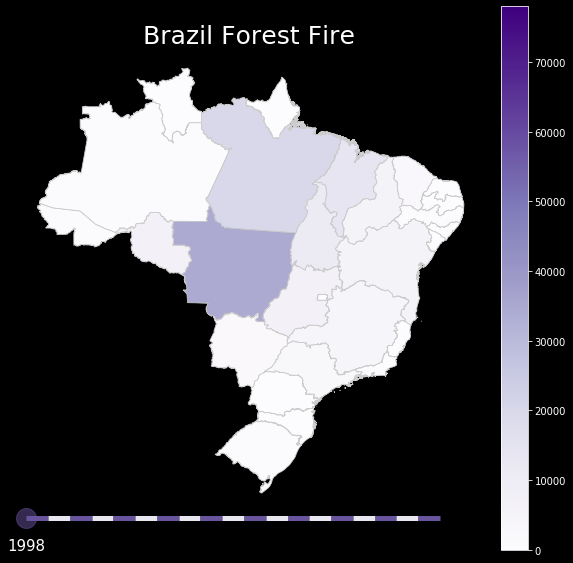

In [175]:
# Try plot map with 1 example
if DEBUG:
    left = map_df.copy()
    right = wide_df.copy().iloc[:,0:2]
    right.rename(columns={"state" : "name"}, inplace=True)
    plot_df = pd.merge(left, right, on="name", how="left")

    vmin = wide_df.iloc[:,1:].min().min()
    vmin = int(math.floor(vmin/1000))*1000
    vmax = wide_df.iloc[:,1:].max().max()
    vmax = int(math.ceil(vmax/1000))*1000

    year = 1998
    fig = plot_df.plot(column=year, cmap="Purples", figsize=(10, 10), linewidth=0.8, edgecolor="0.8", vmin=vmin, vmax=vmax, legend=True, norm=plt.Normalize(vmin=vmin, vmax=vmax))

    fig.axis("off")
    fig.set_title('Brazil Forest Fire', fontdict={'fontsize': '25', 'fontweight' : '3'})

    x_coord = 2 * year - 4071
    fig.plot(x_coord, -36, "o", color="#69549E", markersize=20, alpha=0.5, clip_on=False, zorder=100)
    fig.text(x_coord, -39, str(year), horizontalalignment="center", fontsize=15)

    plt.ylim(-35,7)
    plt.xlim(-75,-34)

    for n in range(1, 20) :
        x_coord = -75 + (n - 1) * 2
        color = '#69549E' if n % 2 else '#E8E7EF'
        plt.hlines(-36, x_coord, x_coord + 2, colors=color, lw=5, clip_on=False, zorder=100)

    plt.show()

In [177]:
# Plot multiple maps
if SAVE_PLOT:
    left = map_df.copy()
    right = wide_df.copy()
    right.rename(columns={"state" : "name"}, inplace=True)
    plot_df = pd.merge(left, right, on="name", how="left")

    vmin = wide_df.iloc[:,1:].min().min()
    vmin = int(math.floor(vmin/1000))*1000
    vmax = wide_df.iloc[:,1:].max().max()
    vmax = int(math.ceil(vmax/1000))*1000

    year_list = wide_df.columns[1:]

    for year in year_list:
        fig = plot_df.plot(column=year, cmap="Purples", figsize=(10, 10), linewidth=0.8, edgecolor="0.8", vmin=vmin, vmax=vmax, legend=True, norm=plt.Normalize(vmin=vmin, vmax=vmax))
        
        fig.axis("off")
        fig.set_title('Brazil Forest Fire', fontdict={'fontsize': '25', 'fontweight' : '3'})
        
        x_coord = 2 * year - 4071
        fig.plot(x_coord, -36, "o", color="#69549E", markersize=20, alpha=0.5, clip_on=False, zorder=100)
        fig.text(x_coord, -39, str(year), horizontalalignment="center", fontsize=15)

        plt.ylim(-35,7)
        plt.xlim(-75,-34)

        for n in range(1, 20):
            x_coord = -75 + (n - 1) * 2
            color = '#69549E' if n % 2 else '#E8E7EF'
            plt.hlines(-36, x_coord, x_coord + 2, colors=color, lw=5, clip_on=False, zorder=100)

        filepath = os.path.join("maps", str(year)+'.png')
        chart = fig.get_figure()
        chart.savefig(filepath, dpi=300)

        plt.close()

    print("done")

In [ ]:
# Output images to Gif using image magick
if SAVE_PLOT:
    imgs = glob.glob('*.png')

    cmd = ['magick','convert', '-loop', '0', '-delay', '40'] + imgs + ['magicksmap.gif']
    subprocess.call(cmd)

## Data Visualization
### 1. Plot of forest fire

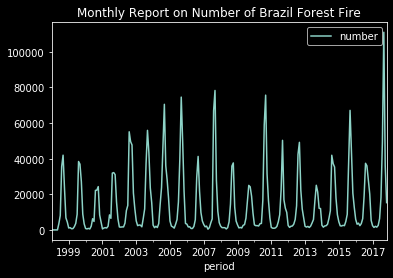

In [178]:
df.groupby(["period"]).sum().plot()
plt.title("Monthly Report on Number of Brazil Forest Fire")
plt.show()

### 2. Table form

In [179]:
wide_df = df.copy()
wide_df["year"] = wide_df.period.map(lambda t: t.year)
wide_df["month"] = wide_df.period.map(lambda t: t.month)
wide_df = wide_df.groupby(["year", "month"])
wide_df = wide_df.sum().unstack()
wide_df.columns = wide_df.columns.droplevel()

display(wide_df)

month,1,2,3,4,5,6,7,8,9,10,11,12
year,,,,,,,,,,,,
1998,0.0,0.0,0.0,0.0,0.0,3551.0,8066.0,35549.0,41968.0,23495.0,6804.0,4448.0
1999,1081.0,1284.0,667.0,717.0,1812.0,3632.0,8756.0,38415.0,36913.0,27012.0,8860.0,3377.0
2000,778.0,561.0,848.0,537.0,2097.0,6275.0,4739.0,22202.0,22319.0,24321.0,8399.0,4465.0
2001,547.0,1059.0,1268.0,1081.0,2090.0,8433.0,6490.0,31887.0,32193.0,31038.0,15639.0,6201.0
2002,1654.0,1570.0,1679.0,1682.0,3818.0,10839.0,13751.0,55099.0,49566.0,47722.0,20691.0,11944.0
2003,5091.0,2398.0,2749.0,2677.0,1747.0,6506.0,11804.0,37382.0,55913.0,43295.0,23572.0,15342.0
2004,2705.0,1255.0,2040.0,1335.0,3535.0,14262.0,23809.0,48038.0,70531.0,36002.0,27892.0,17524.0
2005,4990.0,2153.0,1706.0,1011.0,3210.0,5811.0,15663.0,39912.0,74574.0,49876.0,21752.0,3636.0
2006,3255.0,1666.0,1774.0,792.0,808.0,1968.0,5722.0,29443.0,41264.0,21854.0,9754.0,5027.0


### 3. Overall trend

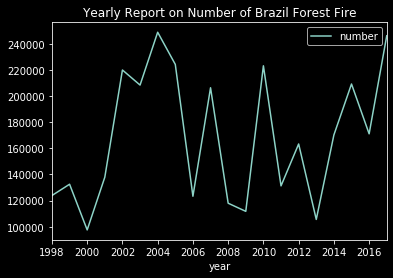

In [180]:
by_year = df.copy()
by_year["year"] = by_year.period.map(lambda t: t.year)
by_year = by_year.groupby(["year"]).sum().plot()
plt.title("Yearly Report on Number of Brazil Forest Fire")
plt.xticks(np.arange(1998, 2017, 2))
plt.show()

### 4. Seasonal of forest fire

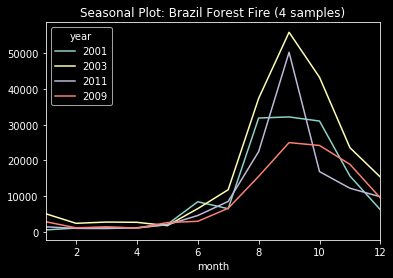

In [181]:
seed = 111
wide_df.sample(n=4, random_state=seed).T.plot()
plt.title("Seasonal Plot: Brazil Forest Fire (4 samples)")
plt.show()

## This is a markdown

lksdajkfjalskdjf
asdfasdf
asdfasdf

<br>
<br>
<br>
jasldkfjlkasdf






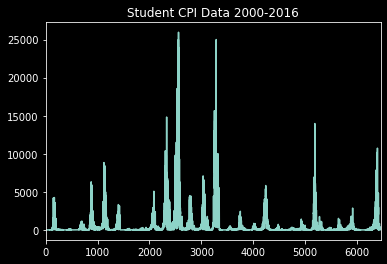

In [117]:
from methods.naive import plot_graph

plot_graph(df)

In [118]:
from methods.naive import show_na

show_na(df)

period    0
state     0
number    0
dtype: int64

In [119]:
# Assign X and y
X = df.iloc[:, 1].values
y = df.iloc[:, 2].values

In [120]:
# from PIL import Image
from IPython.display import display, Image

path = './png_to_gif.gif'

with open(path, 'rb') as file:
    display(Image(file.read()))

FileNotFoundError: [Errno 2] No such file or directory: './png_to_gif.gif'

![img](png_to_gif.gif)